# Install and Load Libraries


In [1]:
!git clone https://github.com/rapidsai/rapidsai-csp-utils.git
!python rapidsai-csp-utils/colab/pip-install.py

Cloning into 'rapidsai-csp-utils'...
remote: Enumerating objects: 596, done.
remote: Counting objects: 100% (162/162), done.
remote: Compressing objects: 100% (80/80), done.
remote: Total 596 (delta 128), reused 82 (delta 82), pack-reused 434 (from 3)
Receiving objects: 100% (596/596), 195.77 KiB | 1012.00 KiB/s, done.
Resolving deltas: 100% (302/302), done.
Installing RAPIDS remaining 25.04 libraries
Using Python 3.11.13 environment at: /usr
Resolved 173 packages in 1.23s
 Downloaded cuproj-cu12
 Downloaded rmm-cu12
 Downloaded cudf-cu12
 Downloaded shapely
 Downloaded datashader
 Downloaded libkvikio-cu12
 Downloaded ucx-py-cu12
 Downloaded dask
 Downloaded pylibcugraph-cu12
 Downloaded bokeh
 Downloaded librmm-cu12
 Downloaded cuspatial-cu12
 Downloaded cuml-cu12
 Downloaded cugraph-cu12
 Downloaded cucim-cu12
 Downloaded libcuspatial-cu12
 Downloaded pylibcudf-cu12
 Downloaded nvidia-nvcomp-cu12
 Downloaded libraft-cu12
 Downloaded libcudf-cu12
 Downloaded raft-dask-cu12
 Downloade

In [2]:
!pip install kaggle --quiet

In [4]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [5]:
!kaggle datasets download -d kaushiksuresh147/bitcoin-tweets

Dataset URL: https://www.kaggle.com/datasets/kaushiksuresh147/bitcoin-tweets
License(s): CC0-1.0
 96% 669M/695M [00:01<00:00, 262MB/s]
100% 695M/695M [00:02<00:00, 348MB/s]


In [6]:
!unzip bitcoin-tweets.zip

Archive:  bitcoin-tweets.zip
  inflating: Bitcoin_tweets.csv      
  inflating: Bitcoin_tweets_dataset_2.csv  


# Data Extraction


In [30]:
import cudf
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib.dates as mdates

df = cudf.read_csv("/content/Bitcoin_tweets.csv")

In [31]:
df

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,DeSota Wilson,"Atlanta, GA","Biz Consultant, real estate, fintech, startups...",2009-04-26 20:05:09,8534.0,7605,4838,False,2021-02-10 23:59:04,Blue Ridge Bank shares halted by NYSE after #b...,['bitcoin'],Twitter Web App,False
1,CryptoND,<NA>,😎 BITCOINLIVE is a Dutch platform aimed at inf...,2019-10-17 20:12:10,6769.0,1532,25483,False,2021-02-10 23:58:48,"😎 Today, that's this #Thursday, we will do a ""...","['Thursday', 'Btc', 'wallet', 'security']",Twitter for Android,False
2,Tdlmatias,"London, England","IM Academy : The best #forex, #SelfEducation, ...",2014-11-10 10:50:37,128.0,332,924,False,2021-02-10 23:54:48,"Guys evening, I have read this article about B...",<NA>,Twitter Web App,False
3,Crypto is the future,<NA>,I will post a lot of buying signals for BTC tr...,2019-09-28 16:48:12,625.0,129,14,False,2021-02-10 23:54:33,$BTC A big chance in a billion! Price: \487264...,"['Bitcoin', 'FX', 'BTC', 'crypto']",dlvr.it,False
4,Alex Kirchmaier 🇦🇹🇸🇪 #FactsSuperspreader,Europa,Co-founder @RENJERJerky | Forbes 30Under30 | I...,2016-02-03 13:15:55,1249.0,1472,10482,False,2021-02-10 23:54:06,This network is secured by 9 508 nodes as of t...,['BTC'],Twitter Web App,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4689349,TAnotepad,Not financial advice,#Bitcoin | Forever Alone Crypto Trader 😭 | Ana...,2022-11-04 10:18:11,674,1789,27466,False,2023-01-06 17:46:35,"Bitcoin squeeze is SUPER TIGHT, which way will...","['BTC', 'bitcoin', 'Crypto', 'cryptocurrency',...",Twitter for Android,False
4689350,Boba-Feh,South of the North Pole,My backpack has jets. Reformed Necromonger,2008-04-02 21:48:47,79,454,125,False,2023-01-06 17:46:29,Closed #BTC short at 16725. Missed my long pla...,['BTC'],Twitter for Android,False
4689351,Ethereum Yoda,<NA>,UP or DOWN...\n.\n.\n.\n.\nPrice matters NOT.,2022-07-24 04:50:18,532,1,0,False,2023-01-06 17:46:22,#Ethereum price update: \n\n#ETH $1263.59 USD\...,"['Ethereum', 'ETH', 'Bitcoin', 'BTC', 'altcoin...",Twitter Web App,False
4689352,Bitcoin Price Ticker,<NA>,Tweets the current price of #bitcoin every 5 m...,2022-10-20 07:10:38,83,7,9,False,2023-01-06 17:46:20,1₿ = $16814.7 -0.07%🔻\n\nDetails:\nChange: 🔻-1...,"['bitcoin', 'btc']",BitcoinLivePriceTicker,False


In [32]:
df.info()


<class 'cudf.core.dataframe.DataFrame'>
RangeIndex: 4689354 entries, 0 to 4689353
Data columns (total 13 columns):
 #   Column            Dtype
---  ------            -----
 0   user_name         object
 1   user_location     object
 2   user_description  object
 3   user_created      object
 4   user_followers    object
 5   user_friends      object
 6   user_favourites   object
 7   user_verified     object
 8   date              object
 9   text              object
 10  hashtags          object
 11  source            object
 12  is_retweet        bool
dtypes: bool(1), object(12)
memory usage: 2.1+ GB


In [33]:
df.describe()


,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
count,4689246,2352595,4169415,4689354,4689354,4689354,4689354,4689354,4689354,4689354,4671838,4685271,4688536
unique,653024,100601,683983,620891,92741,27428,136185,68,3668409,4570199,1013168,3109,2
top,Live Price Crypto,United States,UP or DOWN...\n.\n.\n.\n.\nPrice matters NOT.,2022-03-10 14:06:46,0.0,0.0,0.0,False,2022-05-31 06:02:30,💸 Earn free #BTC and multiply crypto up to 15%...,['Bitcoin'],Twitter for Android,False
freq,41701,63086,29410,43465,59504,118773,183707,4656533,373,1351,608574,1281003,4688536


# Data Cleaning


In [34]:
print("Initial size of the dataframe (GB):", df.memory_usage(deep=True).sum() / 1e9)


Initial size of the dataframe (GB): 2.224832429


In [35]:
df['user_followers'] = cudf.to_numeric(df['user_followers'], errors='coerce')

nan_followers_rows = df[df['user_followers'].isna()]
print("Rows with non-numeric values in 'user_followers':")
display(nan_followers_rows)

df['user_followers'] = df['user_followers'].astype('float32')

Rows with non-numeric values in 'user_followers':


,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
2612133,Electronics: Find tech deals for smartphones,watches,headphones,speakers,<NA>,2021-10-09 06:21:24,1.0,35,20,False,2022-03-24 16:52:46,Isn`t it awesome?,<NA>


In [36]:
df['user_friends'] = cudf.to_numeric(df['user_friends'], errors='coerce')
df['user_favourites'] = cudf.to_numeric(df['user_favourites'], errors='coerce')


nan_friends_favs_rows = df[df['user_friends'].isna() | df['user_favourites'].isna()]
print("Rows with non-numeric values in 'user_friends' or 'user_favourites':")
display(nan_friends_favs_rows)



df['user_friends'] = df['user_friends'].astype('uint32')
df['user_favourites'] = df['user_favourites'].astype('uint32')

Rows with non-numeric values in 'user_friends' or 'user_favourites':


,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
64943,Can roam the world，It's nine to five againᵕᴗᵕ)...,2020-11-09 19:44:24,9,141,36.0,<NA>,<NA>,@krakenfx #ETH #BTC If you want to become po...,"['ETH', 'BTC', 'Bitcoin']",Twitter Web App,False,<NA>,<NA>
137068,*Muhammad Yasir* hello stalker nice to tweet ...,2009-08-31 07:40:42,280.0,623,499.0,<NA>,<NA>,Official ESHOP Airdrop. If You Missed Meme Tok...,"['cryptocurrency', 'BSC', 'Bitcoin', 'Ethereum...",Twitter for Android,False,<NA>,<NA>
180575,• Learn n To Do d'Best...!!!!!!!!,2010-08-16 10:55:09,52.0,277,127.0,<NA>,<NA>,@pufferswap Nice project\n\n@karnoto_hendrik \...,"['YieldFarming', 'Airdrop', 'Binance', 'Bitcoi...",Twitter Web App,False,<NA>,<NA>
693194,FB- Xiomara Castañeda,2015-12-21 18:17:12,9.0,81,531.0,<NA>,<NA>,#btc to the moon 🚀🚀 77774,['btc'],Twitter Web App,False,<NA>,<NA>
697397,Pin bb : 26ea62f8 . Line : baliratih_bali,2012-06-01 01:08:25,4.0,110,21.0,<NA>,<NA>,#btc to the moon 🚀🚀 46059,['btc'],Twitter Web App,False,<NA>,<NA>
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4571986,<NA>,For better or for worse!!,2017-06-03 00:00:07,223,4.0,0.0,<NA>,2022-11-21 12:19:01,Yesterday was fun we trade $ROSE $BTC $SAND $C...,"['BTC', 'Bitcoin', 'Ethereum']",Twitter Web App,False,<NA>
4573311,<NA>,This account isnt verified because it's a nobo...,2017-01-27 15:52:02,210,34.0,0.0,<NA>,2022-11-21 11:14:26,Uniswap and Aave continue to operate during on...,"['CurrencyTimes', 'Bitcoin', 'Solana', 'AVAX',...",Twitter Web App,False,<NA>
4573753,<NA>,Welcome to the Clone Council. A Community Buil...,2017-08-16 12:16:35,132,19.0,1.0,<NA>,2022-11-21 10:50:28,Robinhood seeks sanctions investigators ahead ...,"['CurrencyTimes', 'Bitcoin', 'Solana', 'nft', ...",Twitter Web App,False,<NA>
4576195,<NA>,I try not 2 be rude..laid bk..goofy...always t...,2017-11-11 04:44:31,228,18.0,0.0,<NA>,2022-11-21 20:11:52,Green Cherry #NFT #NFTS #ETH $ETH #BTC $BTC #B...,"['NFT', 'NFTS', 'ETH', 'BTC', 'BNB', 'TRX', 'M...",Twitter Web App,False,<NA>


In [37]:
for col in ['user_description', 'user_location']:
    if col in df.columns and df[col].isnull().any():
        mode_val = df[col].mode()[0] if not df[col].mode().empty else ''
        df[col] = df[col].fillna(mode_val)

In [38]:
if 'text' in df.columns:
    df['text'] = df['text'].str.lower()


import re
if 'text' in df.columns:
    df['text'] = df['text'].str.replace(r'http\S+|www.\S+', '', regex=True)

if 'text' in df.columns:
    df['text'] = df['text'].str.replace(r'@\w+', '', regex=True)

if 'text' in df.columns:
    df['text'] = df['text'].str.replace(r'#\w+', '', regex=True)

if 'text' in df.columns:
    df['text'] = df['text'].str.replace(r'[^a-zA-Z0-9\s]', '', regex=True)

if 'text' in df.columns:
    df['text'] = df['text'].str.strip().str.replace(r'\s+', ' ', regex=True)

if 'text' in df.columns:
    df['text'] = df['text'].str.replace(r'&[a-z]+;', '', regex=True)

In [39]:
if 'user_verified' in df.columns and df['user_verified'].dtype == 'object':
    unique_values = df['user_verified'].unique()
    print(f"Unique values in 'user_verified' column: {unique_values}")

    if 'True' in unique_values or 'False' in unique_values:
        df['user_verified'] = df['user_verified'].astype('bool')
    elif 0 in unique_values or 1 in unique_values:
         df['user_verified'] = cudf.to_numeric(df['user_verified'], errors='coerce').astype('bool')

    if 'user_verified' in df.columns and df['user_verified'].isnull().any():
         mode_bool = df['user_verified'].mode()[0] if not df['user_verified'].mode().empty else False
         df['user_verified'] = df['user_verified'].fillna(mode_bool)

    print(f"Data type of 'user_verified' after conversion: {df['user_verified'].dtype}")

for col in ['user_friends', 'user_favourites']:
    if col in df.columns and df[col].dtype == 'object':
        print(f"Column '{col}' is still 'object'. Attempting conversion to numeric.")
        df[col] = cudf.to_numeric(df[col], errors='coerce')

        if df[col].isnull().any():
             mean_val = df[col].mean()

             if not cudf.isnull(mean_val):
                df[col] = df[col].fillna(mean_val)
             else:
                df[col] = df[col].fillna(0)


        if col == 'user_friends':
             df[col] = df[col].astype('uint32')
        elif col == 'user_favourites':
             df[col] = df[col].astype('uint32')

        print(f"Data type of '{col}' after conversion: {df[col].dtype}")


Unique values in 'user_verified' column: 0                                                 False
1                                                  True
2     @krakenfx  #ETH #BTC  If you want to become po...
3     Official ESHOP Airdrop. If You Missed Meme Tok...
4     @pufferswap Nice project\n\n@karnoto_hendrik \...
                            ...                        
63                                  2022-11-21 12:19:01
64                                  2022-11-21 11:14:26
65                                  2022-11-21 10:50:28
66                                  2022-11-21 20:11:52
67                                  2022-11-21 18:15:29
Name: user_verified, Length: 68, dtype: object
Data type of 'user_verified' after conversion: bool


In [40]:
for col in ['user_description']:
    if col in df.columns:
        df[col] = df[col].str.lower()
        df[col] = df[col].str.replace(r'http\S+|www.\S+', '', regex=True)
        df[col] = df[col].str.replace(r'@\w+', '', regex=True)
        df[col] = df[col].str.replace(r'#\w+', '', regex=True)
        df[col] = df[col].str.replace(r'[^a-zA-Z0-9\s]', '', regex=True)
        df[col] = df[col].str.strip().str.replace(r'\s+', ' ', regex=True)
        df[col] = df[col].str.replace(r'&[a-z]+;', '', regex=True)
        df[col] = df[col].fillna('')

In [41]:
for col in ['user_location', 'source']:
    if col in df.columns and df[col].dtype == 'object':

        unique_count = df[col].nunique()
        total_rows = len(df)
        if unique_count / total_rows < 0.5:
            print(f"Converting column '{col}' to category.")
            df[col] = df[col].astype('category')
        else:
            print(f"Column '{col}' has too many unique values for category conversion.")

Converting column 'user_location' to category.
Converting column 'source' to category.


In [42]:
if df.isnull().sum().sum() / (df.shape[0] * df.shape[1]) > 0.5:
    print("Considering sparse dataframe conversion (requires significant nulls/zeros).")

In [43]:
if 'hashtags' in df.columns and df['hashtags'].isnull().any():
    df['hashtags'] = df['hashtags'].fillna('')

if 'source' in df.columns and df['source'].isnull().any():
    if 'Unknown Source' not in df['source'].cat.categories:
        df['source'] = df['source'].cat.add_categories('Unknown Source')

    df['source'] = df['source'].fillna('Unknown Source')


print("\nNaN counts after handling:")
print(df[['hashtags', 'source']].isnull().sum())


NaN counts after handling:
hashtags    0
source      0
dtype: int64


In [44]:
if 'date' in df.columns and 'user_created' in df.columns:
    date_series_pd = df['date'].to_pandas()
    date_series_dt = pd.to_datetime(date_series_pd, errors='coerce')
    df['date'] = cudf.Series(date_series_dt)


    user_created_series_pd = df['user_created'].to_pandas()
    user_created_series_dt = pd.to_datetime(user_created_series_pd, errors='coerce')
    df['user_created'] = cudf.Series(user_created_series_dt)


    print("\nData types after converting to datetime:")
    print(df[['date', 'user_created']].dtypes)

    print("\nNumber of rows where 'date' conversion failed:", df['date'].isnull().sum())
    print("Number of rows where 'user_created' conversion failed:", df['user_created'].isnull().sum())
else:
    print("One or both of the 'date' or 'user_created' columns do not exist in the DataFrame.")


Data types after converting to datetime:
date            datetime64[ns]
user_created    datetime64[ns]
dtype: object

Number of rows where 'date' conversion failed: 66
Number of rows where 'user_created' conversion failed: 66


In [45]:
df.info()

<class 'cudf.core.dataframe.DataFrame'>
RangeIndex: 4689354 entries, 0 to 4689353
Data columns (total 13 columns):
 #   Column            Dtype
---  ------            -----
 0   user_name         object
 1   user_location     category
 2   user_description  object
 3   user_created      datetime64[ns]
 4   user_followers    float32
 5   user_friends      uint32
 6   user_favourites   uint32
 7   user_verified     bool
 8   date              datetime64[ns]
 9   text              object
 10  hashtags          object
 11  source            category
 12  is_retweet        bool
dtypes: bool(2), category(2), datetime64[ns](2), float32(1), object(4), uint32(2)
memory usage: 1.2+ GB


In [46]:
df.describe()

,user_created,user_followers,user_friends,user_favourites,date
count,4689288,4.689353e+06,4.689336e+06,4.689289e+06,4689288
mean,2018-10-01 16:53:47.413887232,8.155691e+03,1.081280e+03,6.599966e+03,2022-02-07 17:32:26.303887104
min,1970-01-01 00:00:00,0.000000e+00,0.000000e+00,0.000000e+00,2021-02-05 10:52:04
25%,2016-09-02 00:16:30.000000000,5.100000e+01,4.000000e+01,5.600000e+01,2021-08-26 01:47:39.250000128
50%,2020-09-27 14:52:42.500000000,2.380000e+02,1.980000e+02,6.080000e+02,2022-03-02 22:24:31.500000000
75%,2021-08-18 18:22:20.000000000,1.422000e+03,7.390000e+02,3.824000e+03,2022-06-03 12:40:22.000000000
max,2023-01-09 19:25:11,2.413135e+07,4.201104e+06,1.567894e+06,2023-01-09 23:59:54
std,<NA>,9.931332e+04,5.988113e+03,2.280579e+04,<NA>


In [47]:
print("Final volume of the dataframe (GB):", df.memory_usage(deep=True).sum() / 1e9)

Final volume of the dataframe (GB): 1.331950392


In [48]:
df

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,DeSota Wilson,"Atlanta, GA",biz consultant real estate fintech startups po...,2009-04-26 20:05:09,8534.0,7605,4838,True,2021-02-10 23:59:04,blue ridge bank shares halted by nyse after at...,['bitcoin'],Twitter Web App,False
1,CryptoND,United States,bitcoinlive is a dutch platform aimed at infor...,2019-10-17 20:12:10,6769.0,1532,25483,True,2021-02-10 23:58:48,today thats this we will do a take 2 with our ...,"['Thursday', 'Btc', 'wallet', 'security']",Twitter for Android,False
2,Tdlmatias,"London, England",im academy the best trading education platform...,2014-11-10 10:50:37,128.0,332,924,True,2021-02-10 23:54:48,guys evening i have read this article about bt...,,Twitter Web App,False
3,Crypto is the future,United States,i will post a lot of buying signals for btc tr...,2019-09-28 16:48:12,625.0,129,14,True,2021-02-10 23:54:33,btc a big chance in a billion price 48726440 2...,"['Bitcoin', 'FX', 'BTC', 'crypto']",dlvr.it,False
4,Alex Kirchmaier 🇦🇹🇸🇪 #FactsSuperspreader,Europa,cofounder forbes 30under30 innovation economis...,2016-02-03 13:15:55,1249.0,1472,10482,True,2021-02-10 23:54:06,this network is secured by 9 508 nodes as of t...,['BTC'],Twitter Web App,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4689349,TAnotepad,Not financial advice,forever alone crypto trader analysis perspecti...,2022-11-04 10:18:11,674.0,1789,27466,True,2023-01-06 17:46:35,bitcoin squeeze is super tight which way will ...,"['BTC', 'bitcoin', 'Crypto', 'cryptocurrency',...",Twitter for Android,False
4689350,Boba-Feh,South of the North Pole,my backpack has jets reformed necromonger,2008-04-02 21:48:47,79.0,454,125,True,2023-01-06 17:46:29,closed short at 16725 missed my long place by ...,['BTC'],Twitter for Android,False
4689351,Ethereum Yoda,United States,up or down price matters not,2022-07-24 04:50:18,532.0,1,0,True,2023-01-06 17:46:22,price update 126359 usd 007511819 follow for r...,"['Ethereum', 'ETH', 'Bitcoin', 'BTC', 'altcoin...",Twitter Web App,False
4689352,Bitcoin Price Ticker,United States,tweets the current price of every 5 minutes,2022-10-20 07:10:38,83.0,7,9,True,2023-01-06 17:46:20,1 168147 007 details change 1205 24h low 16710...,"['bitcoin', 'btc']",BitcoinLivePriceTicker,False


#Statistic and probability


--- Annual Analysis ---

Annual descriptive statistics for followers, friends, and favourites:
       user_followers                                                        \
                count         mean            std  min   25%    50%     75%   
year                                                                          
2021.0      1999523.0  8882.296875  113304.726562  0.0  42.0  202.0  1265.0   
2022.0      2628878.0  7622.139648   87213.125000  0.0  59.0  264.0  1531.0   
2023.0        60887.0  7339.476562   75999.460938  0.0  83.0  509.0  1752.0   

                   user_friends               ...                    \
               max        count         mean  ...    75%        max   
year                                          ...                     
2021.0  24131346.0    1999523.0  1281.445769  ...  829.0  4201104.0   
2022.0  17477088.0    2628878.0   936.893173  ...  675.0   780881.0   
2023.0   5754390.0      60887.0   742.733753  ...  507.0   242479.0   

  

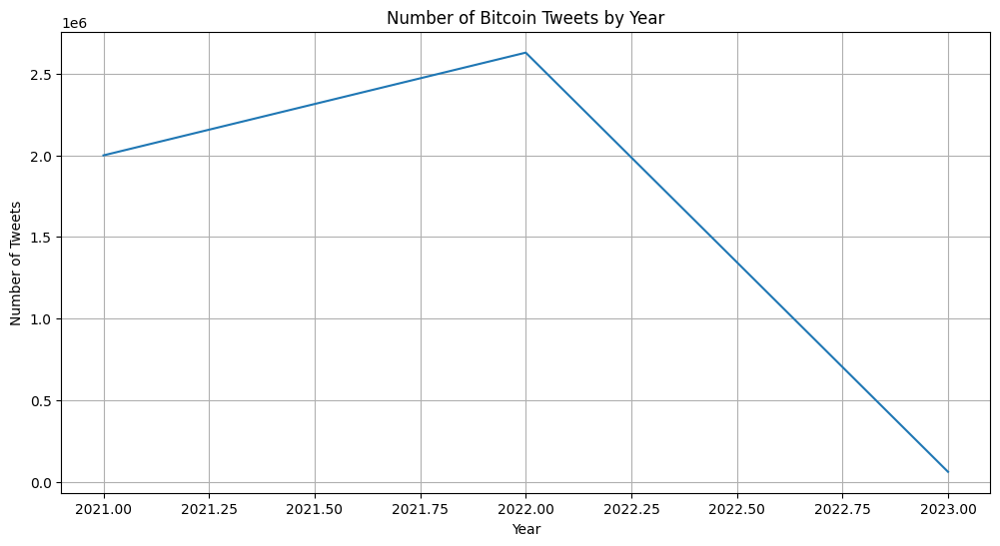

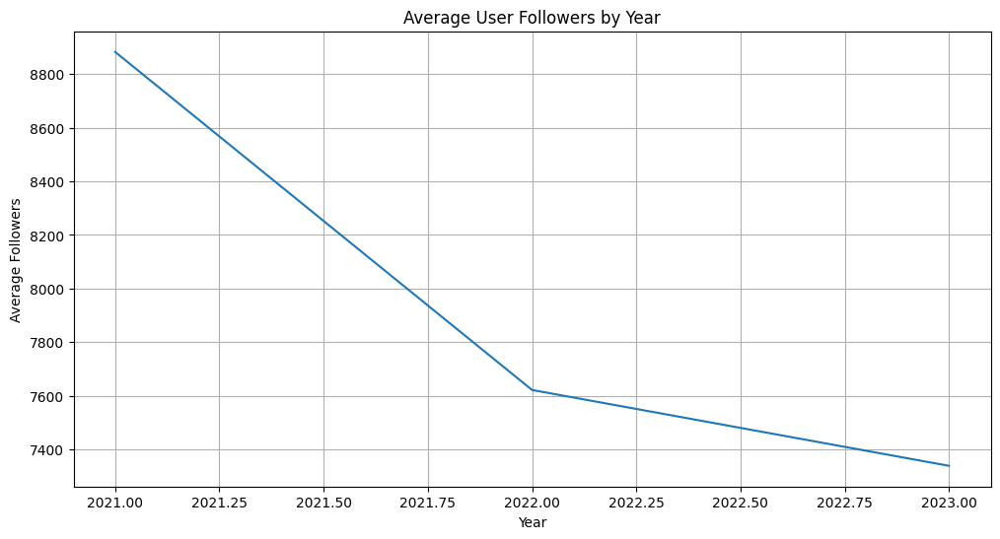

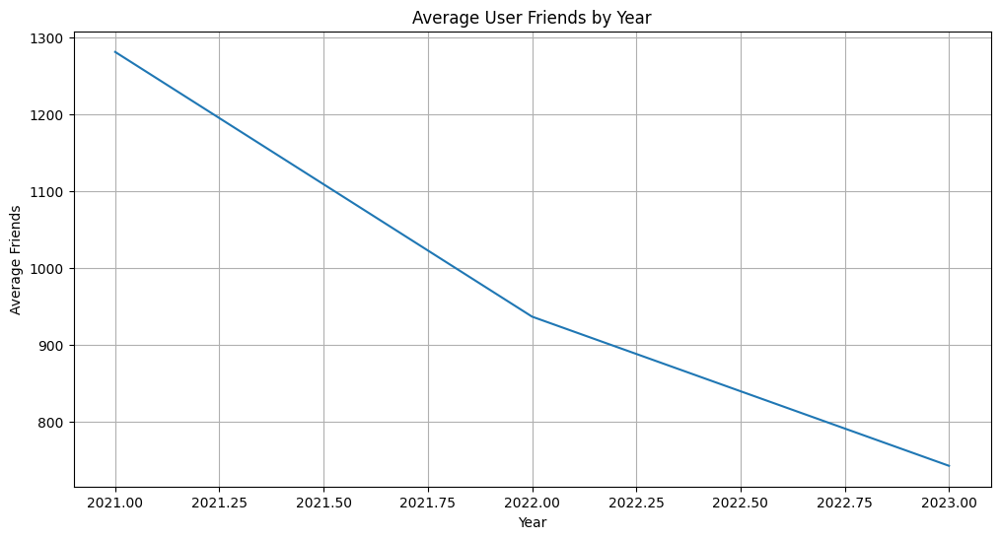

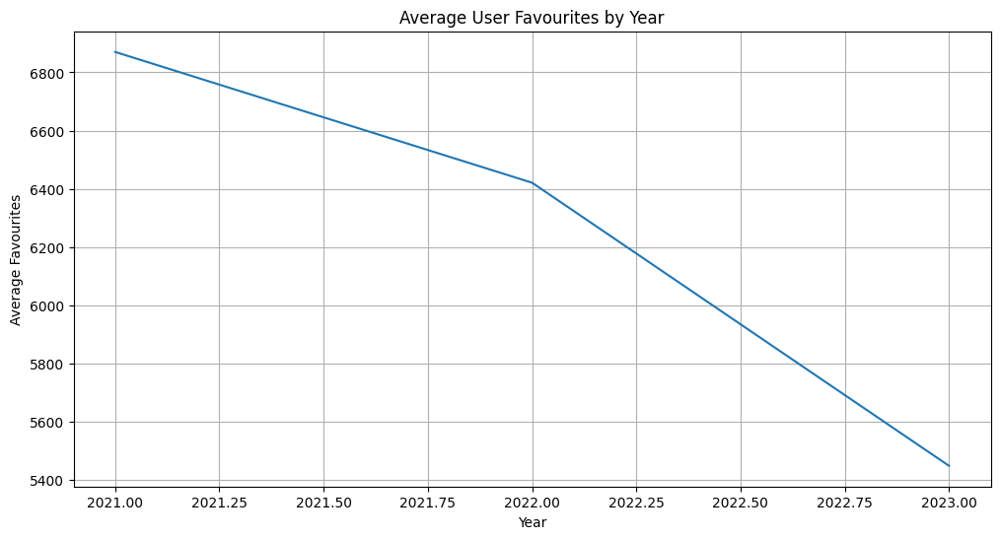

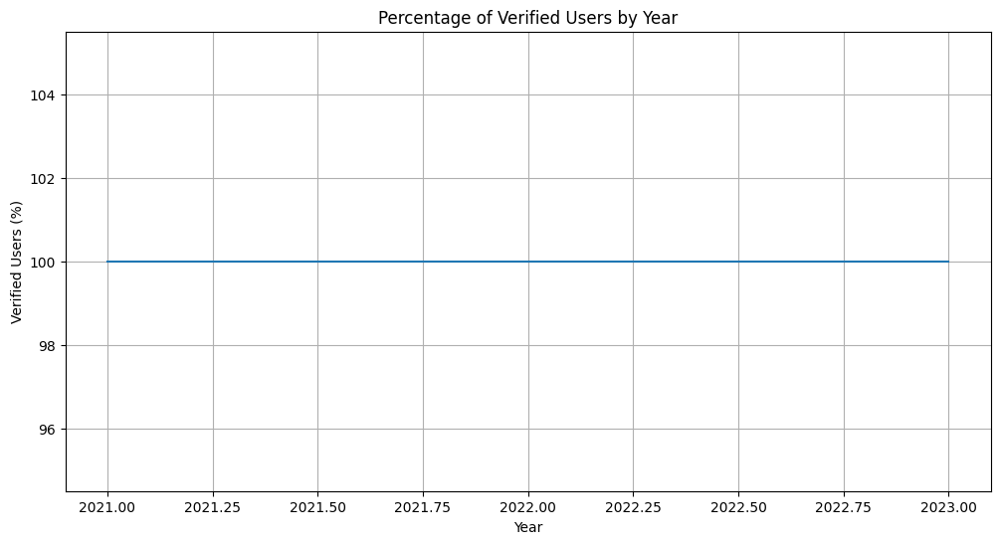


Distribution of tweet sources by year (Top 5):
year    source             
2021.0  Twitter for Android    575197
        Twitter Web App        524412
        Twitter for iPhone     391904
        IFTTT                   30944
        dlvr.it                 26063
2022.0  Twitter Web App        732886
        Twitter for Android    695863
        Twitter for iPhone     473612
        vaiotapi                41686
        IFTTT                   39877
2023.0  Twitter Web App         18866
        Twitter for Android      9943
        Twitter for iPhone       9149
        vaiotapi                 1779
        IFTTT                    1626
Name: count, dtype: int64


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2344 (\N{DEVANAGARI LETTER NA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Matplotlib currently does not support Devanagari natively.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2350 (\N{DEVANAGARI LETTER MA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2360 (\N{DEVANAGARI LETTER SA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2381 (\N{DEVANAGARI SIGN VIRAMA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/p

In [51]:
print("\n--- Annual Analysis ---")

df_pd = df.to_pandas()

df_pd['year'] = df_pd['date'].dt.year

print("\nAnnual descriptive statistics for followers, friends, and favourites:")
print(df_pd.groupby('year')[['user_followers', 'user_friends', 'user_favourites']].describe())

tweets_per_year = df_pd['year'].value_counts().sort_index()
print("\nNumber of tweets per year:")
print(tweets_per_year)


plt.figure(figsize=(12, 6))
sns.lineplot(x=tweets_per_year.index, y=tweets_per_year.values)
plt.title('Number of Bitcoin Tweets by Year')
plt.xlabel('Year')
plt.ylabel('Number of Tweets')
plt.grid(True)
plt.show()


avg_followers_year = df_pd.groupby('year')['user_followers'].mean()
plt.figure(figsize=(12, 6))
sns.lineplot(x=avg_followers_year.index, y=avg_followers_year.values)
plt.title('Average User Followers by Year')
plt.xlabel('Year')
plt.ylabel('Average Followers')
plt.grid(True)
plt.show()


avg_friends_year = df_pd.groupby('year')['user_friends'].mean()
plt.figure(figsize=(12, 6))
sns.lineplot(x=avg_friends_year.index, y=avg_friends_year.values)
plt.title('Average User Friends by Year')
plt.xlabel('Year')
plt.ylabel('Average Friends')
plt.grid(True)
plt.show()


avg_favourites_year = df_pd.groupby('year')['user_favourites'].mean()
plt.figure(figsize=(12, 6))
sns.lineplot(x=avg_favourites_year.index, y=avg_favourites_year.values)
plt.title('Average User Favourites by Year')
plt.xlabel('Year')
plt.ylabel('Average Favourites')
plt.grid(True)
plt.show()


verified_users_year = df_pd.groupby('year')['user_verified'].mean() * 100
plt.figure(figsize=(12, 6))
sns.lineplot(x=verified_users_year.index, y=verified_users_year.values)
plt.title('Percentage of Verified Users by Year')
plt.xlabel('Year')
plt.ylabel('Verified Users (%)')
plt.grid(True)
plt.show()


if 'source' in df_pd.columns:
    print("\nDistribution of tweet sources by year (Top 5):")
    source_yearly_counts = df_pd.groupby('year')['source'].value_counts().groupby(level=0).head(5)
    print(source_yearly_counts)


    plt.figure(figsize=(14, 7))
    source_yearly_counts_df = source_yearly_counts.rename('count').reset_index()
    sns.lineplot(data=source_yearly_counts_df, x='year', y='count', hue='source', marker='o')
    plt.title('Number of Tweets from Top Sources by Year')
    plt.xlabel('Year')
    plt.ylabel('Tweet Count')
    plt.legend(title='Source')
    plt.grid(True)
    plt.show()


--- Monthly Analysis ---

Monthly descriptive statistics for followers, friends, and favourites:
           user_followers                                                   \
                    count          mean            std  min     25%    50%   
year_month                                                                   
2021-02           44443.0   5831.786133   55392.652344  0.0   75.00  397.0   
2021-03            4140.0   4326.709473   29762.962891  0.0   62.75  333.0   
2021-04           58060.0   4368.037598   40141.613281  0.0   92.00  437.0   
2021-05           21782.0   4181.254883   28251.085938  0.0   74.00  516.0   
2021-06          125795.0  11154.590820  133148.734375  0.0   43.00  231.0   
2021-07          466079.0  10134.345703  138145.656250  0.0   42.00  218.0   
2021-08          488987.0   8743.410156  114382.359375  0.0   40.00  183.0   
2021-09           23510.0   9679.354492   77884.085938  0.0   49.00  242.0   
2021-10          351796.0   8340.598633   81

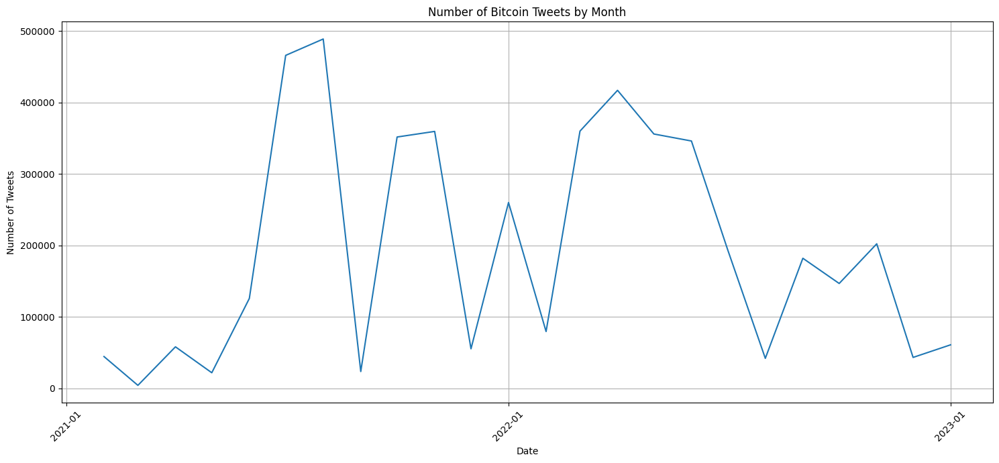

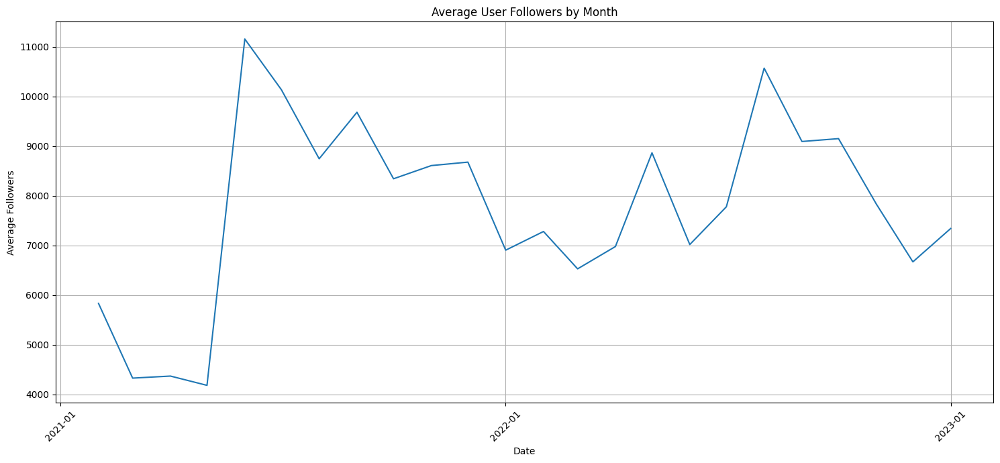

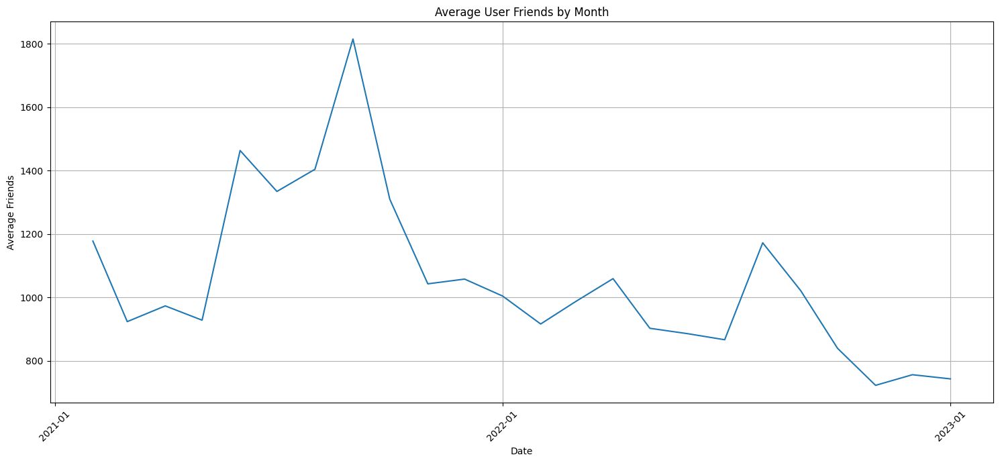

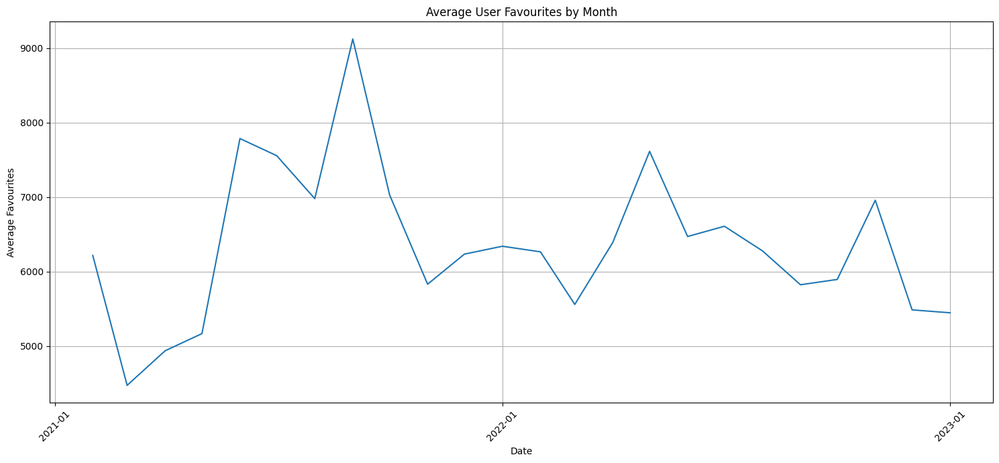

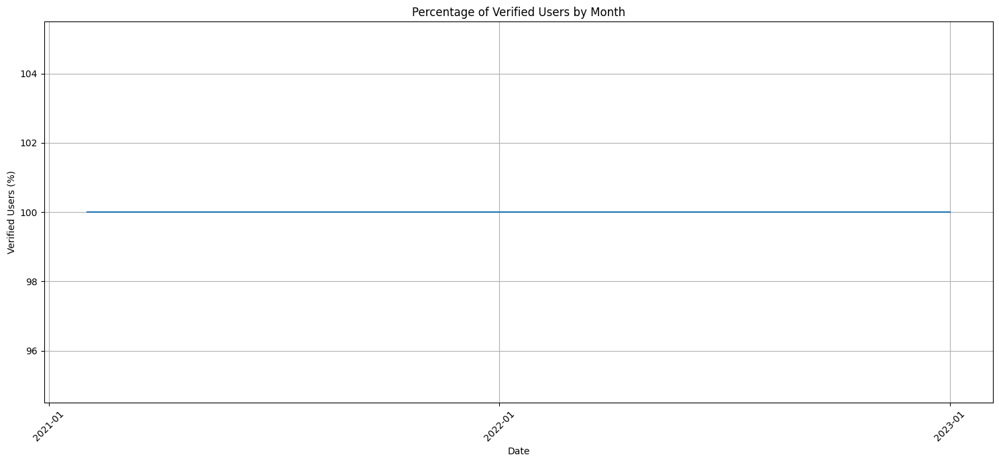

In [52]:
print("\n--- Monthly Analysis ---")


df_pd['year_month'] = df_pd['date'].dt.to_period('M')


print("\nMonthly descriptive statistics for followers, friends, and favourites:")
print(df_pd.groupby('year_month')[['user_followers', 'user_friends', 'user_favourites']].describe())


tweets_per_month = df_pd['year_month'].value_counts().sort_index()
tweets_per_month.index = tweets_per_month.index.to_timestamp()
print("\nNumber of tweets per month:")
print(tweets_per_month)


plt.figure(figsize=(15, 7))
sns.lineplot(x=tweets_per_month.index, y=tweets_per_month.values)
plt.title('Number of Bitcoin Tweets by Month')
plt.xlabel('Date')
plt.ylabel('Number of Tweets')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


avg_followers_month = df_pd.groupby('year_month')['user_followers'].mean()
avg_followers_month.index = avg_followers_month.index.to_timestamp()
plt.figure(figsize=(15, 7))
sns.lineplot(x=avg_followers_month.index, y=avg_followers_month.values)
plt.title('Average User Followers by Month')
plt.xlabel('Date')
plt.ylabel('Average Followers')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


avg_friends_month = df_pd.groupby('year_month')['user_friends'].mean()
avg_friends_month.index = avg_friends_month.index.to_timestamp()
plt.figure(figsize=(15, 7))
sns.lineplot(x=avg_friends_month.index, y=avg_friends_month.values)
plt.title('Average User Friends by Month')
plt.xlabel('Date')
plt.ylabel('Average Friends')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


avg_favourites_month = df_pd.groupby('year_month')['user_favourites'].mean()
avg_favourites_month.index = avg_favourites_month.index.to_timestamp()
plt.figure(figsize=(15, 7))
sns.lineplot(x=avg_favourites_month.index, y=avg_favourites_month.values)
plt.title('Average User Favourites by Month')
plt.xlabel('Date')
plt.ylabel('Average Favourites')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


verified_users_month = df_pd.groupby('year_month')['user_verified'].mean() * 100
verified_users_month.index = verified_users_month.index.to_timestamp()
plt.figure(figsize=(15, 7))
sns.lineplot(x=verified_users_month.index, y=verified_users_month.values)
plt.title('Percentage of Verified Users by Month')
plt.xlabel('Date')
plt.ylabel('Verified Users (%)')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()



--- Daily Analysis (Sample for One Week) ---

Daily descriptive statistics for the sample (from 2021-02-01 to 2021-02-08):
           user_followers                                                 \
                    count         mean           std  min     25%    50%   
date_only                                                                  
2021-02-05         1694.0  4548.698242  22628.300781  0.0  103.25  496.5   
2021-02-06         3278.0  5057.975098  43571.007812  0.0   85.00  386.5   
2021-02-07         3030.0  3971.020752  41778.546875  0.0  102.00  312.5   

                               user_friends               ...         \
                75%        max        count         mean  ...    75%   
date_only                                                 ...          
2021-02-05  2765.00   731739.0       1694.0  1489.763872  ...  901.0   
2021-02-06  1994.00  1471998.0       3278.0  1044.278829  ...  691.5   
2021-02-07  2166.25  1524983.0       3030.0  1106.153795  .

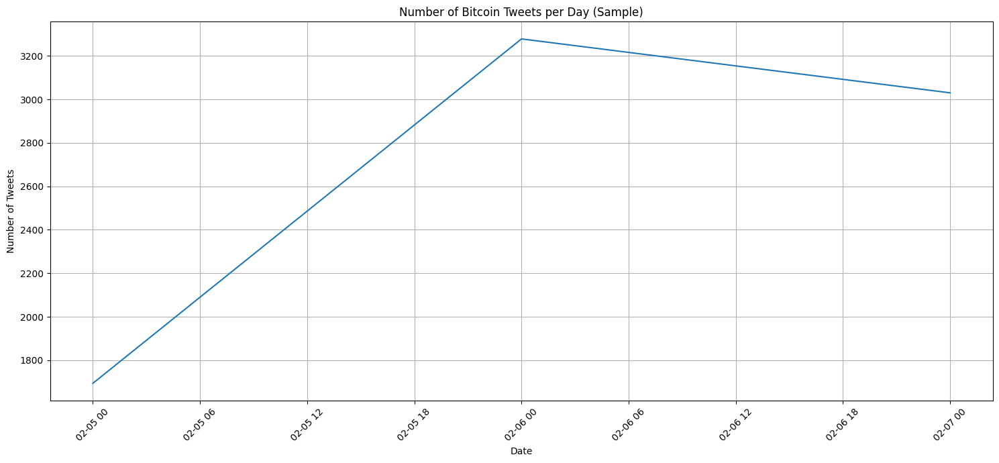

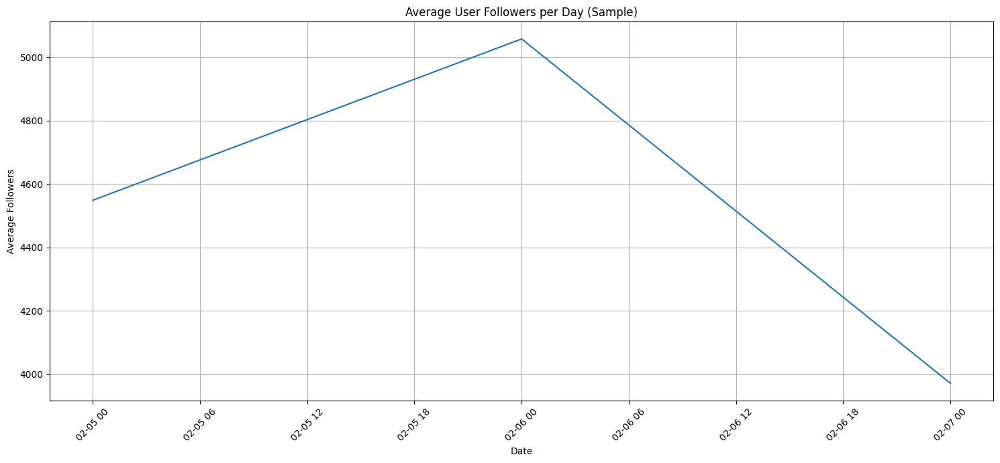

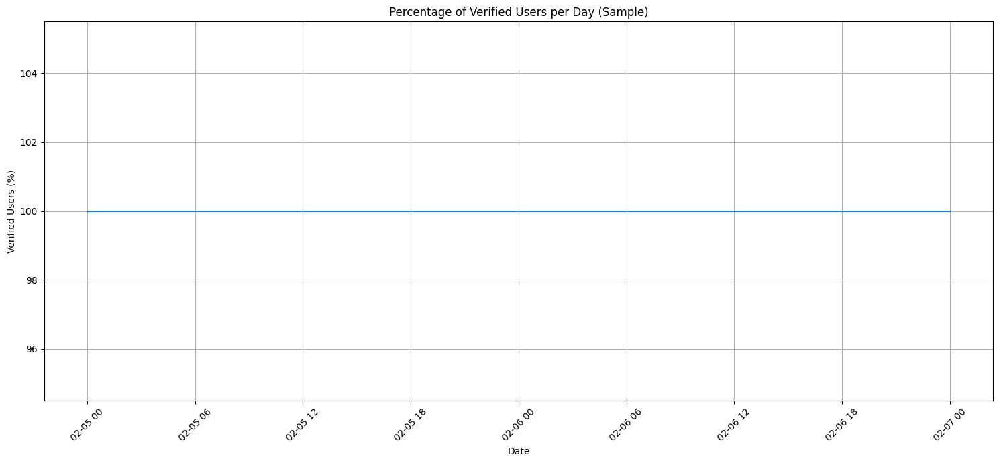

In [58]:
print("\n--- Daily Analysis (Sample for One Week) ---")

first_year = df_pd['year'].min()
start_date = pd.to_datetime(f'{int(first_year)}-02-01')
end_date = start_date + pd.Timedelta(days=7)

df_daily_sample = df_pd[(df_pd['date'] >= start_date) & (df_pd['date'] < end_date)].copy()

if not df_daily_sample.empty:
    df_daily_sample['date_only'] = df_daily_sample['date'].dt.date

    print(f"\nDaily descriptive statistics for the sample (from {start_date.date()} to {end_date.date()}):")
    print(df_daily_sample.groupby('date_only')[['user_followers', 'user_friends', 'user_favourites']].describe())

    tweets_per_day = df_daily_sample['date_only'].value_counts().sort_index()
    print("\nNumber of tweets per day (sample):")
    print(tweets_per_day)


    plt.figure(figsize=(15, 7))
    sns.lineplot(x=tweets_per_day.index, y=tweets_per_day.values)
    plt.title('Number of Bitcoin Tweets per Day (Sample)')
    plt.xlabel('Date')
    plt.ylabel('Number of Tweets')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


    avg_followers_day = df_daily_sample.groupby('date_only')['user_followers'].mean()
    plt.figure(figsize=(15, 7))
    sns.lineplot(x=avg_followers_day.index, y=avg_followers_day.values)
    plt.title('Average User Followers per Day (Sample)')
    plt.xlabel('Date')
    plt.ylabel('Average Followers')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


    verified_users_day = df_daily_sample.groupby('date_only')['user_verified'].mean() * 100
    plt.figure(figsize=(15, 7))
    sns.lineplot(x=verified_users_day.index, y=verified_users_day.values)
    plt.title('Percentage of Verified Users per Day (Sample)')
    plt.xlabel('Date')
    plt.ylabel('Verified Users (%)')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

else:
    print("The selected time range for daily analysis is empty. Please choose a different range.")

In [62]:

sns.set_style("whitegrid")
!mkdir -p ./pairplots


df_pd = df.to_pandas()

numeric_cols = df_pd.select_dtypes(include=['number']).columns.tolist()


cols_to_plot = [
    'user_followers',
    'user_friends',
    'user_favourites',
]

categorical_cols_for_hue = [
    'user_verified'
]

plot_cols = [col for col in cols_to_plot if col in df_pd.columns]
hue_cols = [col for col in categorical_cols_for_hue if col in df_pd.columns]

if not plot_cols:
  print("No suitable numeric columns found for pairplot.")
else:
  for hue_col in hue_cols:
    plt.rcParams["figure.figsize"] = [10, 5]
    sns.pairplot(df_pd[plot_cols + [hue_col]].dropna(), hue=hue_col, diag_kind="kde")

    sanitized_col_name = re.sub(r'[^a-zA-Z0-9_]', '', hue_col)

    plt.savefig(f"./pairplots/{sanitized_col_name}-pairplot.png", dpi=150, bbox_inches='tight')
    plt.close()

  print(f"Pairplots saved for columns: {hue_cols}")



KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7d8a80ab18a0> (for post_execute):


KeyboardInterrupt: 